In [7]:
pip install --upgrade pydot



[notice] A new release of pip available: 22.3.1 -> 24.0
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [1]:
import os
import pydot
import sys

# Set the path to the Graphviz installation
graphviz_path = os.path.join(os.path.dirname(sys.executable), "graphviz")
# pydot.find_graphviz(graphviz_path)

In [2]:
import dowhy
from dowhy import CausalModel

import numpy as np
import pandas as pd
import graphviz
import networkx as nx

np.set_printoptions(precision=3, suppress=True)
np.random.seed(0)

/home/none/Documents/mystock/stock/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Utility function

In [3]:
def make_graph(adjacency_matrix, labels=None):
    idx = np.abs(adjacency_matrix) > 0.01
    dirs = np.where(idx)
    d = graphviz.Digraph(engine='dot')
    # d = graphviz.Digraph()
    names = labels if labels else [f'x{i}' for i in range(len(adjacency_matrix))]
    for name in names:
        d.node(name)
    for to, from_, coef in zip(dirs[0], dirs[1], adjacency_matrix[idx]):
        d.edge(names[from_], names[to], label=str(coef))
    return d

def str_to_dot(string):
    '''
    Converts input string from graphviz library to valid DOT graph format.
    '''
    graph = string.strip().replace('\n', ';').replace('\t','')
    graph = graph[:9] + graph[10:-2] + graph[-1] # Removing unnecessary characters from string
    return graph

## Experiments on the Auto-MPG dataset

In this section, we will use a dataset on the technical specification of cars. The dataset is downloaded from UCI Machine Learning Repository.

### 1. Load the data

In [22]:
data_mpg = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data-original',
                   delim_whitespace=True, header=None,
                   names = ['mpg', 'cylinders', 'displacement',
                            'horsepower', 'weight', 'acceleration',
                            'model year', 'origin', 'car name'])
data_mpg.dropna(inplace=True)
data_mpg.drop(['model year', 'origin', 'car name'], axis=1, inplace=True)
print(data_mpg.shape)
data_mpg.head()

/tmp/ipykernel_931583/2879590791.py:1: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data_mpg = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data-original',


(392, 6)


,mpg,cylinders,displacement,horsepower,weight,acceleration
0,18.0,8.0,307.0,130.0,3504.0,12.0
1,15.0,8.0,350.0,165.0,3693.0,11.5
2,18.0,8.0,318.0,150.0,3436.0,11.0
3,16.0,8.0,304.0,150.0,3433.0,12.0
4,17.0,8.0,302.0,140.0,3449.0,10.5


## Causal Discovery with causal-learn

https://causal-learn.readthedocs.io/en/latest/

apt-get install graphviz

PC

Depth=3, working on node 5: 100%|██████████| 6/6 [00:00<00:00, 272.14it/s] 


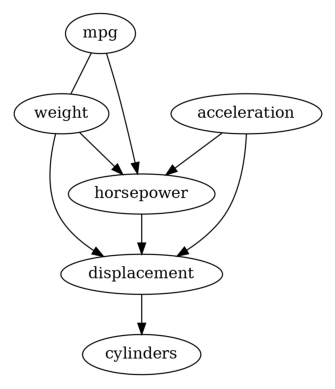

In [23]:
from causallearn.search.ConstraintBased.PC import pc

labels = [f'{col}' for i, col in enumerate(data_mpg.columns)]
data = data_mpg.to_numpy()

cg = pc(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

GES


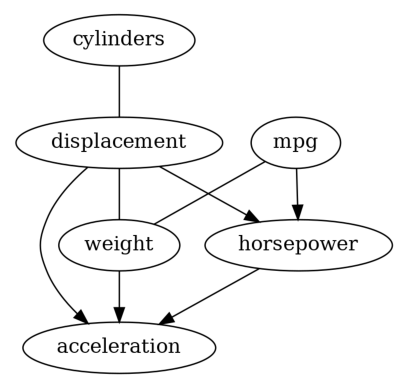

In [24]:
from causallearn.search.ScoreBased.GES import ges

# default parameters
Record = ges(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(Record['G'], labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()


Well, these two results are different, which is not rare when applying causal discovery on real-world dataset, since the required assumptions on the data-generating process are hard to verify.

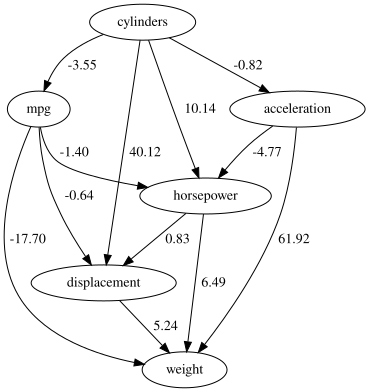

In [25]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(data)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

## Estimate causal effects using Linear Regression

In [26]:
# Obtain valid dot format
graph_dot = make_graph(model.adjacency_matrix_, labels=labels)

# Define Causal Model
model=CausalModel(
        data = data_mpg,
        treatment='mpg',
        outcome='weight',
        graph=str_to_dot(graph_dot.source))

# Identification
identified_estimand = model.identify_effect(proceed_when_unidentifiable=True)
print(identified_estimand)

# Estimation
estimate = model.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=True,
                                test_significance=True)
print("Causal Estimate is " + str(estimate.value))

Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
  d                        
──────(E[weight|cylinders])
d[mpg]                     
Estimand assumption 1, Unconfoundedness: If U→{mpg} and U→weight then P(weight|mpg,cylinders,U) = P(weight|mpg,cylinders)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimator.py:236: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  by_effect_mods = data.groupby(effect_modifier_names)
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, intege

Causal Estimate is -38.94097365620928


/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimator.py:236: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  by_effect_mods = data.groupby(effect_modifier_names)
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, intege

In [27]:
print("Causal Estimate is " + str(estimate.value))


Causal Estimate is -38.94097365620928


## Experiments on the Sachs dataset

The dataset consists of the simultaneous measurements of 11 phosphorylated proteins and phospholipids derived from thousands of individual primary immune system cells, subjected to both general and specific molecular interventions (Sachs et al., 2005).

### 1. Load the data

In [29]:
from causallearn.utils.Dataset import load_dataset

data_sachs, labels = load_dataset("sachs")

print(data_sachs.shape)
print(labels)

(7466, 11)
['raf', 'mek', 'plc', 'pip2', 'pip3', 'erk', 'akt', 'pka', 'pkc', 'p38', 'jnk']


## Causal Discovery with causal-learn

Depth=7, working on node 10: 100%|██████████| 11/11 [00:00<00:00, 360.62it/s]


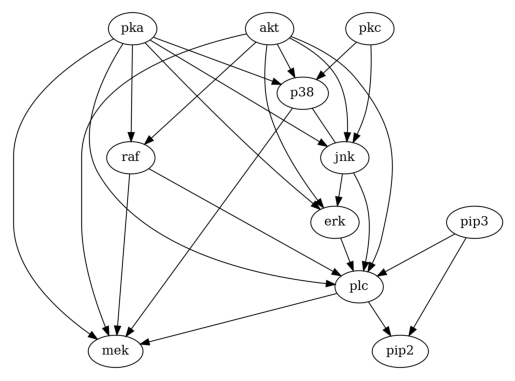

In [30]:
graphs = {}
graphs_nx = {}
labels = [f'{col}' for i, col in enumerate(labels)]
data = data_sachs

from causallearn.search.ConstraintBased.PC import pc

cg = pc(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

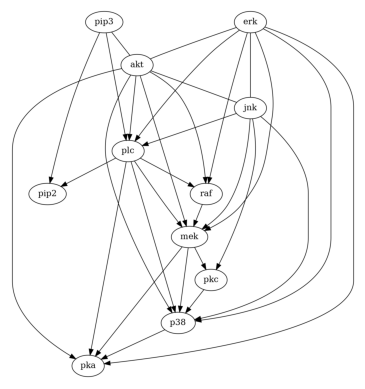

In [31]:
from causallearn.search.ScoreBased.GES import ges

# default parameters
Record = ges(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(Record['G'], labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

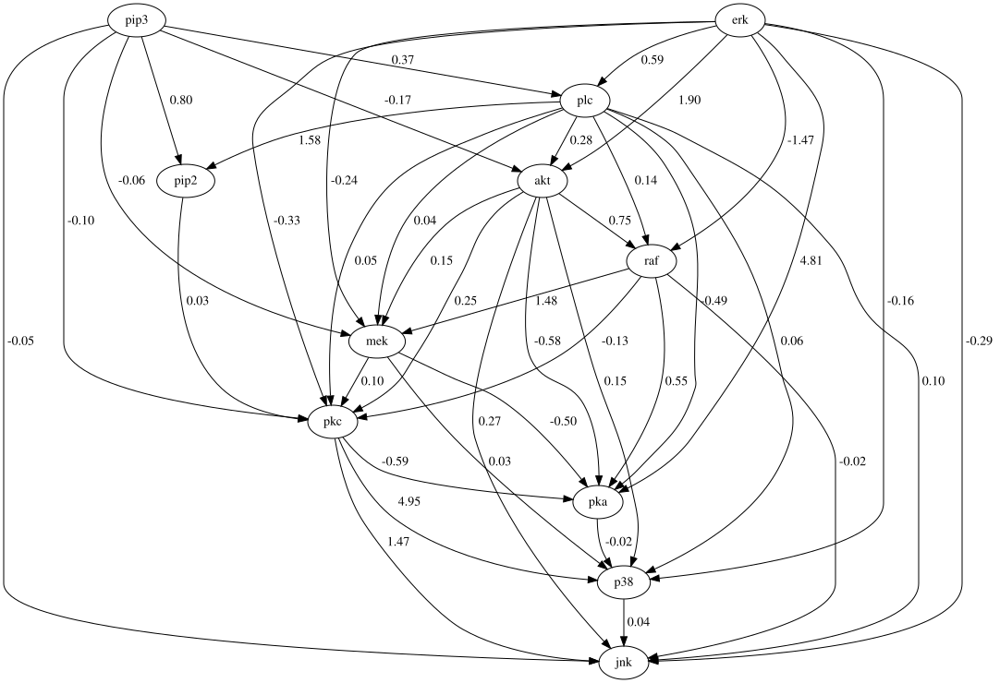

In [32]:
from causallearn.search.FCMBased import lingam
model = lingam.ICALiNGAM()
model.fit(data)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

## Estimate effects using Linear Regression

Use the DAG returned by LiNGAM to estimate the causal effect of PIP2 on PKC.

In [33]:
# Obtain valid dot format
graph_dot = make_graph(model.adjacency_matrix_, labels=labels)

data_df = pd.DataFrame(data=data, columns=labels)

# Define Causal Model
model_est=CausalModel(
        data = data_df,
        treatment='pip2',
        outcome='pkc',
        graph=str_to_dot(graph_dot.source))

# Identification
identified_estimand = model_est.identify_effect(proceed_when_unidentifiable=False)
print(identified_estimand)

# Estimation
estimate = model_est.estimate_effect(identified_estimand,
                                method_name="backdoor.linear_regression",
                                control_value=0,
                                treatment_value=1,
                                confidence_intervals=True,
                                test_significance=True)


Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
   d                    
───────(E[pkc|plc,pip3])
d[pip₂]                 
Estimand assumption 1, Unconfoundedness: If U→{pip2} and U→pkc then P(pkc|pip2,plc,pip3,U) = P(pkc|pip2,plc,pip3)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!



/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimator.py:236: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  by_effect_mods = data.groupby(effect_modifier_names)
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/home/none/Documents/mystock/stock/lib/python3.10/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, intege

In [34]:
print("Causal Estimate is " + str(estimate.value))


Causal Estimate is 0.0339718922845158


# Test on Stock Data

In [8]:
import yfinance as yf


In [9]:
# Download historical stock data for multiple stocks
tickers = ["AAPL", "MSFT", "GOOGL"]  # Example: Apple, Microsoft, and Google
start_date = "2020-01-01"
end_date = "2023-01-01"

In [10]:
# Fetch the closing prices
data = yf.download(tickers, start=start_date, end=end_date)["Close"]

# Compute daily returns as percentage change of the closing prices
daily_returns = data.pct_change().dropna()

[*********************100%%**********************]  3 of 3 completed


In [11]:
daily_returns.head()


Ticker,AAPL,GOOGL,MSFT
Date,,,
2020-01-03,-0.009722,-0.005231,-0.012452
2020-01-06,0.007968,0.026654,0.002585
2020-01-07,-0.004703,-0.001932,-0.009118
2020-01-08,0.016086,0.007118,0.015928
2020-01-09,0.021241,0.010498,0.012493


Depth=1, working on node 2: 100%|██████████| 3/3 [00:00<00:00, 581.79it/s] 


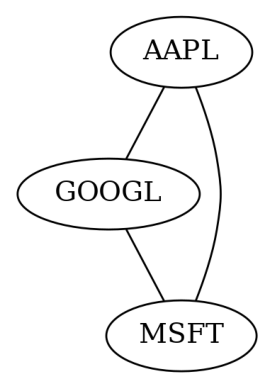

In [12]:
labels = [f'{col}' for i, col in enumerate(daily_returns.columns)]
data = daily_returns.to_numpy()

cg = pc(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(cg.G, labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

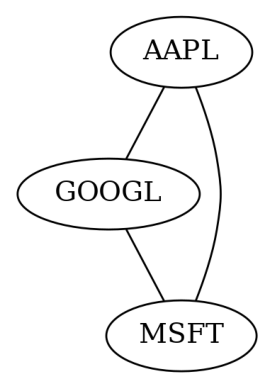

In [13]:
# default parameters
Record = ges(data)

# Visualization using pydot
from causallearn.utils.GraphUtils import GraphUtils
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import io

pyd = GraphUtils.to_pydot(Record['G'], labels=labels)
tmp_png = pyd.create_png(f="png")
fp = io.BytesIO(tmp_png)
img = mpimg.imread(fp, format='png')
plt.axis('off')
plt.imshow(img)
plt.show()

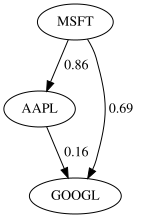

In [14]:
model = lingam.ICALiNGAM()
model.fit(data)

from causallearn.search.FCMBased.lingam.utils import make_dot
make_dot(model.adjacency_matrix_, labels=labels)

In [18]:
daily_returns.head()


Ticker,AAPL,GOOGL,MSFT
Date,,,
2020-01-03,-0.009722,-0.005231,-0.012452
2020-01-06,0.007968,0.026654,0.002585
2020-01-07,-0.004703,-0.001932,-0.009118
2020-01-08,0.016086,0.007118,0.015928
2020-01-09,0.021241,0.010498,0.012493


In [20]:
import dowhy.gcm as gcm

# Null hypothesis: x is independent of y given z
p_value = gcm.independence_test(daily_returns['GOOGL'], daily_returns['AAPL'], conditioned_on=daily_returns['MSFT'], method='kernel')
p_value

then google stock is dependent of apple given microsoft